In [3]:
import os
import cv2
import json
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from tqdm import tqdm

In [4]:
with open(os.path.join(os.getcwd(), "data_path_config.json"), "r") as f:
    config = json.load(f)

config

{'raw_data': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact',
 'processed_data': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact',
 'videos': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact\\videos',
 'visual_features': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact\\visual_features',
 'datasets': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets',
 'datasets_videos': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\videos',
 'datasets_visual_features': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\visual_features',
 'images': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\images',
 'datasets_images': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\images',
 'audio': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\audio',
 'datasets_audio': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\audio',
 'audio_216k': 'D:\\Projects\\masters_diplo

In [5]:
def select_major_emotion(emotion_vector: np.array) -> np.array:
    """
    Returns the major emotion based on significance while retaining the original order.

    :param emotion_vector: List of binary values representing emotions.
    :return: A new binary vector with only the major emotion set to 1.
    """

    # Original order of emotions
    original_order = ["Curiosity", "Uncertainty", "Excitement", "Happiness",
                     "Surprise", "Disgust", "Fear", "Frustration"]

    # New order of significance
    new_order = ["Happiness", "Excitement", "Disgust", "Fear", "Frustration",
                 "Surprise", "Curiosity", "Uncertainty"]

    # Extract emotions from initial vector
    indicated_emotions = [original_order[i] for i, e in enumerate(emotion_vector) if e == 1]

    # Determine the most significant emotion from the new order
    for emotion in new_order:
        if emotion in indicated_emotions:
            major = emotion
            break

    # Create and return the new vector based on original order
    return np.array([1 if emotion == major else 0 for emotion in original_order])

In [6]:
def get_video_length(video_path):
    # Open the video file.
    video = cv2.VideoCapture(video_path)

    # Check if the video file was opened successfully.
    if not video.isOpened():
        print("Error: Could not open video file.")
        return None

    # Get the total number of frames in the video.
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

    # Get the frames per second (FPS) of the video.
    fps = video.get(cv2.CAP_PROP_FPS)

    # Calculate and return the video length in seconds.
    video_length_seconds = round(total_frames / fps, 2)

    # Don't forget to release the video capture object.
    video.release()

    return video_length_seconds

In [7]:
emotion_dict = {
    0: "Curiosity",
    1: "Uncertainty",
    2: "Excitement",
    3: "Happiness",
    4: "Surprise",
    5: "Disgust",
    6: "Fear",
    7: "Frustration"
}

In [8]:
def plot_emotion_distribution(df, dataset_name, use_different_colors=True):
    # Map the encoded emotions to their string names
    df['emotion_name'] = df['major_emotion'].map(emotion_dict)

    # Get the count of each emotion
    emotion_counts = df['emotion_name'].value_counts().reindex(emotion_dict.values())

    # Choose color palette
    if use_different_colors:
        colors = sns.color_palette('husl', len(emotion_counts))
    else:
        colors = [sns.color_palette()[0]] * len(emotion_counts)

    # Create bar plot
    ax = emotion_counts.plot(kind='bar', color=colors)

    # Rotate x-axis labels and set y-label
    plt.xticks(rotation=0, ha='center')
    plt.ylabel('Count')
    plt.xlabel('Emotion name')
    plt.title(f'Distribution of Emotions ("{dataset_name}" dataset)')

    # Adjust the y-axis limit
    ax.set_ylim(0, max(emotion_counts) + max(emotion_counts) * 0.1)  # Add 10% padding

    # Display the count on top of each bar
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

    plt.tight_layout()
    plt.show()

# Train analysis

In [9]:
dataset_name = "Train"
df = pd.read_csv(os.path.join(config["datasets_videos"], "train.csv"))

# Drop cases, where there are no detected emotions
df = df[df.iloc[:, 1:-1].eq(1).any(axis=1)]

emotions_agg = []
for el_id in range(len(df.index)):
    _labels_list = np.array(df.iloc[el_id, 1:-1].values, dtype=int)
    _label = select_major_emotion(emotion_vector=_labels_list)
    emotions_agg.append(np.argmax(_label))

df["major_emotion"] = emotions_agg
df

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
0,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,0,1,0,0,0,0,3.3333,3
1,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,0,0,0,0,6.3333,3
4,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,0,1,0,0,0,0,4.6667,3
6,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,0,0,0,0,6.0000,3
7,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,0,0,0,0,5.0000,3
...,...,...,...,...,...,...,...,...,...,...,...
427,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,1,0,1,1,0,0,0,4.6667,3
428,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,0,1,1,1,0,0,0,5.6667,3
429,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,1,0,1,0,0,0,0,5.3333,3
430,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,1,0,0,0,0,0,0,4.3333,0


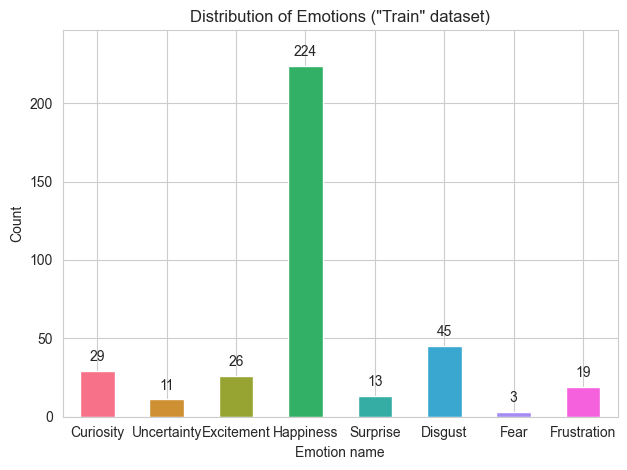

In [10]:
# Plot the data
plot_emotion_distribution(df, dataset_name, use_different_colors=True)

100%|██████████| 370/370 [00:10<00:00, 35.42it/s]


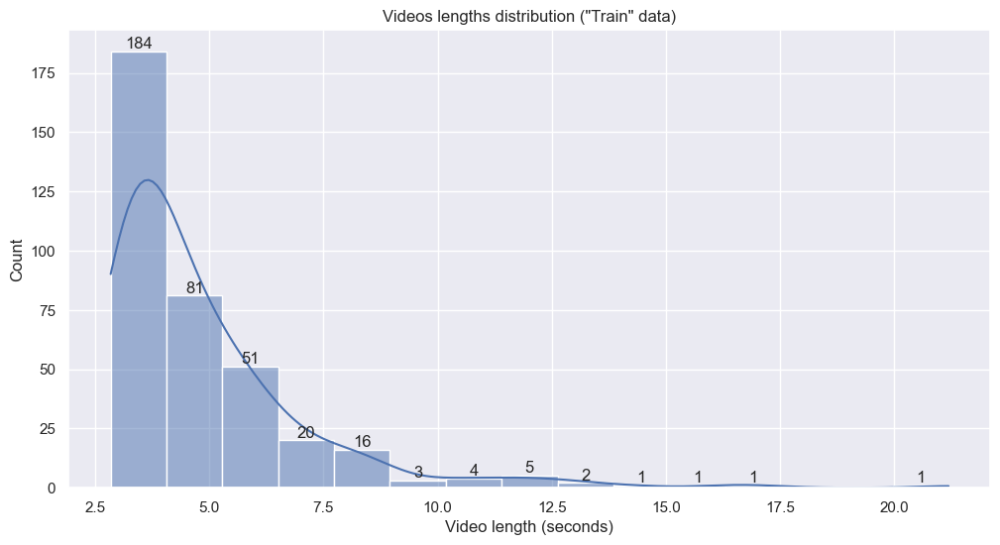

In [11]:
video_length_list = []

for video_path in tqdm(df.file_path.to_list()):
    _vid_length = get_video_length(video_path)
    video_length_list.append(_vid_length)

# Set up the figure size
sns.set(rc={"figure.figsize": (12, 6)})

# Create the histogram and KDE plot
ax = sns.histplot(video_length_list, kde=True, bins=15)

# Get the x and y coordinates of the histogram bars
for p in ax.patches:
    x = p.get_x() + p.get_width() / 2  # X-coordinate: bar center
    y = p.get_height()  # Y-coordinate: bar height
    if y != 0:
        ax.annotate(f'{y}', (x, y), ha='center', va='bottom')  # Annotate the count

plt.xlabel("Video length (seconds)")
plt.ylabel("Count")

plt.title(f'Videos lengths distribution ("{dataset_name}" data)')
plt.show()

# Validation analysis

In [12]:
dataset_name = "Validation"
df = pd.read_csv(os.path.join(config["datasets_videos"], "val.csv"))

# Drop cases, where there are no detected emotions
df = df[df.iloc[:, 1:-1].eq(1).any(axis=1)]

emotions_agg = []
for el_id in range(len(df.index)):
    _labels_list = np.array(df.iloc[el_id, 1:-1].values, dtype=int)
    _label = select_major_emotion(emotion_vector=_labels_list)
    emotions_agg.append(np.argmax(_label))

df["major_emotion"] = emotions_agg
df

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
0,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,0,0,1,0,0,0,3.6667,4
2,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,0,0,0,0,6.6667,3
3,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,0,1,0,0,0,0,4.3333,3
5,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,1,0,0,0,6.6667,3
6,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,0,0,0,0,6.3333,3
...,...,...,...,...,...,...,...,...,...,...,...
298,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,1,0,1,0,0,0,0,4.6667,3
299,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,0,1,0,0,0,0,5.0000,3
300,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,0,0,0,0,1,4.0000,2
301,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,1,0,0,1,0,0,0,3.0000,4


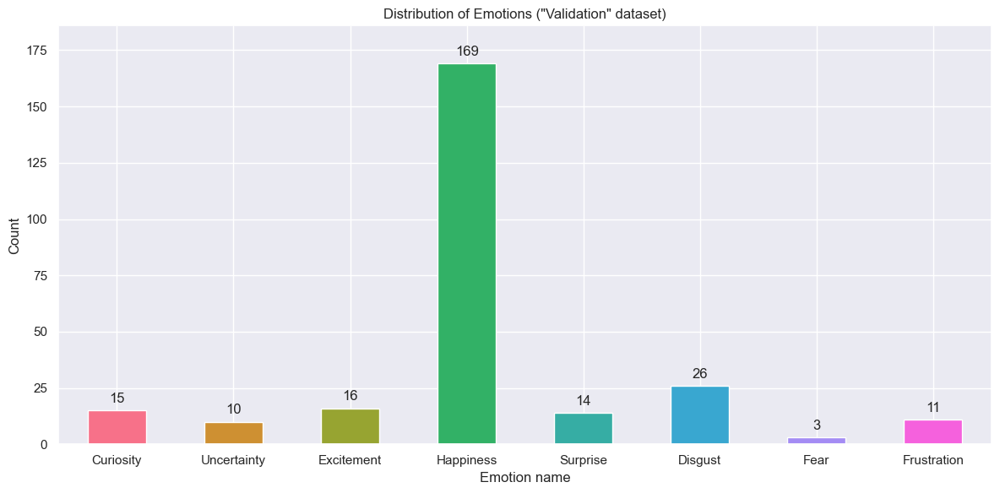

In [13]:
# Plot the data
plot_emotion_distribution(df, dataset_name, use_different_colors=True)

100%|██████████| 264/264 [00:06<00:00, 42.95it/s]


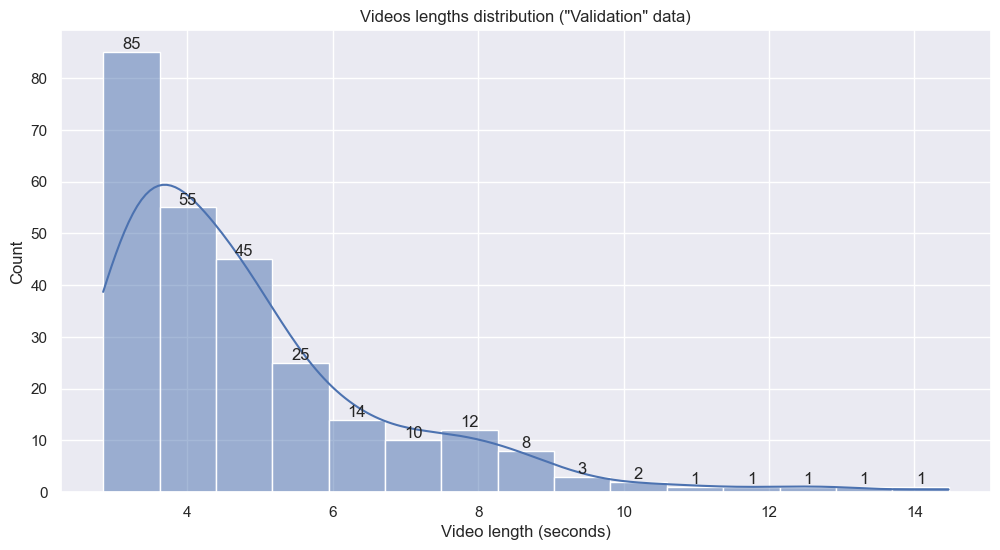

In [14]:
video_length_list = []

for video_path in tqdm(df.file_path.to_list()):
    _vid_length = get_video_length(video_path)
    video_length_list.append(_vid_length)

# Set up the figure size
sns.set(rc={"figure.figsize": (12, 6)})

# Create the histogram and KDE plot
ax = sns.histplot(video_length_list, kde=True, bins=15)

# Get the x and y coordinates of the histogram bars
for p in ax.patches:
    x = p.get_x() + p.get_width() / 2  # X-coordinate: bar center
    y = p.get_height()  # Y-coordinate: bar height
    if y != 0:
        ax.annotate(f'{y}', (x, y), ha='center', va='bottom')  # Annotate the count

plt.xlabel("Video length (seconds)")
plt.ylabel("Count")

plt.title(f'Videos lengths distribution ("{dataset_name}" data)')
plt.show()

# Test analysis

In [15]:
dataset_name = "Test"
df = pd.read_csv(os.path.join(config["datasets_videos"], "test.csv"))

# Drop cases, where there are no detected emotions
df = df[df.iloc[:, 1:-1].eq(1).any(axis=1)]

emotions_agg = []
for el_id in range(len(df.index)):
    _labels_list = np.array(df.iloc[el_id, 1:-1].values, dtype=int)
    _label = select_major_emotion(emotion_vector=_labels_list)
    emotions_agg.append(np.argmax(_label))

df["major_emotion"] = emotions_agg
df

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
1,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,0,0,0,0,5.6667,3
2,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,0,0,0,0,4.6667,3
3,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,1,0,1,0,0,0,0,3.3333,3
4,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,0,1,1,0,0,0,0,6.0000,3
5,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,1,1,0,0,0,0,6.0000,3
...,...,...,...,...,...,...,...,...,...,...,...
362,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,0,1,1,1,0,0,0,6.3333,3
363,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,1,0,0,0,0,0,0,3.6667,0
364,D:\Projects\masters_diploma\data\raw\EmoReact\...,1,0,0,1,0,0,0,0,5.3333,3
365,D:\Projects\masters_diploma\data\raw\EmoReact\...,0,0,0,1,0,0,0,0,4.6667,3


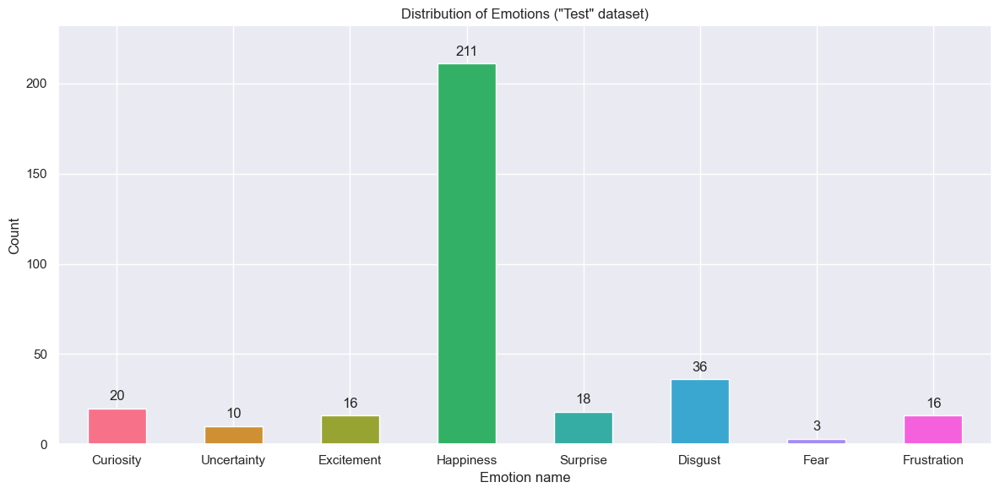

In [16]:
# Plot the data
plot_emotion_distribution(df, dataset_name, use_different_colors=True)

100%|██████████| 330/330 [00:08<00:00, 40.67it/s]


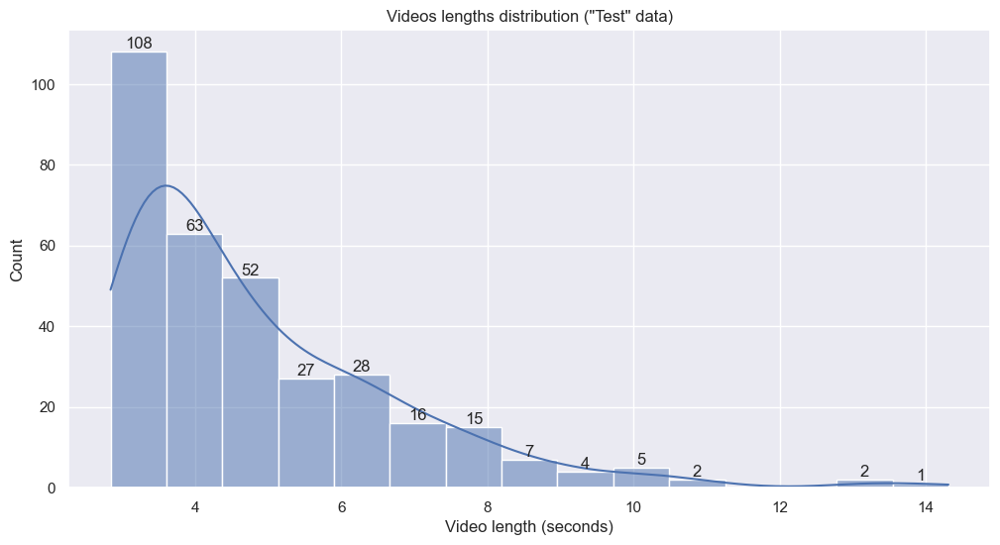

In [17]:
video_length_list = []

for video_path in tqdm(df.file_path.to_list()):
    _vid_length = get_video_length(video_path)
    video_length_list.append(_vid_length)

# Set up the figure size
sns.set(rc={"figure.figsize": (12, 6)})

# Create the histogram and KDE plot
ax = sns.histplot(video_length_list, kde=True, bins=15)

# Get the x and y coordinates of the histogram bars
for p in ax.patches:
    x = p.get_x() + p.get_width() / 2  # X-coordinate: bar center
    y = p.get_height()  # Y-coordinate: bar height
    if y != 0:
        ax.annotate(f'{y}', (x, y), ha='center', va='bottom')  # Annotate the count

plt.xlabel("Video length (seconds)")
plt.ylabel("Count")

plt.title(f'Videos lengths distribution ("{dataset_name}" data)')
plt.show()

# Boxplots of length of videos

In [18]:
video_length_dict = {}

datasets_names = ["train", "val", "test"]

for key in datasets_names:
    df = pd.read_csv(os.path.join(config["datasets_videos"], f"{key}.csv"))

    video_length_dict[key] = []
    for video_path in tqdm(df.file_path.to_list()):
        _vid_length = get_video_length(video_path)
        video_length_dict[key].append(_vid_length)

video_length_dict.keys()

100%|██████████| 367/367 [00:05<00:00, 70.90it/s]


dict_keys(['train', 'val', 'test'])

In [19]:
# Create a box plot for each list
div_name = "train"
trace1 = go.Violin(y=video_length_dict[div_name],
                   name=f'TRAIN length',
                   box_visible=True,
                   meanline_visible=True,
                   points="all")

div_name = "val"
trace2 = go.Violin(y=video_length_dict[div_name],
                   name=f'VALIDATION length',
                   box_visible=True,
                   meanline_visible=True,
                   points="all")

div_name = "test"
trace3 = go.Violin(y=video_length_dict[div_name],
                   name=f'TEST length',
                   box_visible=True,
                   meanline_visible=True,
                   points="all")

# Create figure
fig = go.Figure(data=[trace1, trace2, trace3])
fig.update_layout(
    autosize=False,
    width=1200,
    height=550
)

# Show figure
fig.show()

In [20]:
# Create a box plot for each list
div_name = "train"
trace1 = go.Violin(y=video_length_dict[div_name],
                   name=f'TRAIN length',
                   box_visible=True,
                   meanline_visible=True,
                   points="all")

# Create figure
fig = go.Figure(data=[trace1])
fig.update_layout(
    autosize=False,
    width=1000,
    height=550
)

# Show figure
fig.show()

In [21]:
# Create a box plot for each list
div_name = "val"
trace2 = go.Violin(y=video_length_dict[div_name],
                   name=f'VALIDATION length',
                   box_visible=True,
                   meanline_visible=True,
                   points="all")
# Create figure
fig = go.Figure(data=[trace2])
fig.update_layout(
    autosize=False,
    width=1000,
    height=550
)


# Show figure
fig.show()

In [22]:
# Create a box plot for each list
div_name = "test"
trace3 = go.Violin(y=video_length_dict[div_name],
                   name=f'TEST length',
                   box_visible=True,
                   meanline_visible=True,
                   points="all")

# Create figure
fig = go.Figure(data=[trace3])
fig.update_layout(
    autosize=False,
    width=1000,
    height=550
)


# Show figure
fig.show()

In [23]:
# Function to calculate the Laplacian variance of an image
def laplacian_variance(image: np.ndarray) -> float:
    laplacian = cv2.Laplacian(image, cv2.CV_64F)
    return laplacian.var()

In [24]:
key = "test"
df = pd.read_csv(os.path.join(config["datasets_videos"], f"{key}.csv"))
video_path = os.path.join(
    "D:/Projects/masters_diploma/data/raw/EmoReact/videos/test/ANNOYING_ORANGE89_2.mp4"
)

In [25]:
num_frames: int = 10

# Initialize video capture
cap = cv2.VideoCapture(video_path)

# Get video info: duration and frame count
fps = int(cap.get(cv2.CAP_PROP_FPS))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# print(f"FPS: {fps}")
# print(f"Total Frames: {total_frames}")

# Calculate frames per chunk
frames_per_chunk = total_frames // num_frames

_frames = []
_frames_focus = []

best_frames = []
best_focus_values = [0] * num_frames
current_chunk = 0

for i in range(total_frames)[:frames_per_chunk]:
    ret, frame = cap.read()
    if not ret:
        break


    # Convert to grayscale for focus measurement
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Calculate the Laplacian variance
    focus_value = laplacian_variance(gray)

    _frames.append(frame)
    _frames_focus.append(focus_value)

# Sort both lists based on _frames_focus
sorted_data = sorted(zip(_frames_focus, _frames))

# Separate the sorted data back into two lists
_frames_focus, _frames = zip(*sorted_data)

len(_frames_focus)

10

In [26]:
_frames_focus

(149.28006686999947,
 149.75195940747673,
 149.84085368400739,
 150.82620497888524,
 151.6430769602411,
 153.54297912445065,
 154.55886576291184,
 156.08978598674136,
 158.2665859672217,
 159.63852934163293)

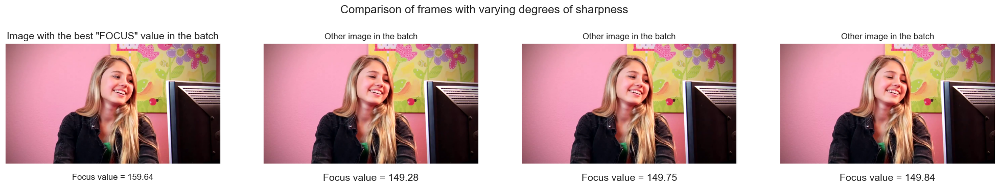

In [27]:
fig, ax = plt.subplots(1, 4, figsize=(25, 4))

ax[0].imshow(cv2.cvtColor(_frames[-1], cv2.COLOR_BGR2RGB))
ax[0].grid(False)  # Disable the grid for each subplot
ax[0].set_title(f'Image with the best "FOCUS" value in the batch', fontsize=14)
ax[0].set_xlabel(f'Focus value = {round(_frames_focus[-1], 2)}', fontsize=12)
ax[0].set_yticklabels([])
ax[0].set_xticklabels([])

ax[1].imshow(cv2.cvtColor(_frames[0], cv2.COLOR_BGR2RGB))
ax[1].grid(False)  # Disable the grid for each subplot
ax[1].set_title(f'Other image in the batch', fontsize=12)
ax[1].set_xlabel(f'Focus value = {round(_frames_focus[0], 2)}', fontsize=14)
ax[1].set_yticklabels([])
ax[1].set_xticklabels([])

ax[2].imshow(cv2.cvtColor(_frames[1], cv2.COLOR_BGR2RGB))
ax[2].grid(False)  # Disable the grid for each subplot
ax[2].set_title(f'Other image in the batch', fontsize=12)
ax[2].set_xlabel(f'Focus value = {round(_frames_focus[1], 2)}', fontsize=14)
ax[2].set_yticklabels([])
ax[2].set_xticklabels([])

ax[3].imshow(cv2.cvtColor(_frames[2], cv2.COLOR_BGR2RGB))
ax[3].grid(False)  # Disable the grid for each subplot
ax[3].set_title(f'Other image in the batch', fontsize=12)
ax[3].set_xlabel(f'Focus value = {round(_frames_focus[2], 2)}', fontsize=14)
ax[3].set_yticklabels([])
ax[3].set_xticklabels([])

# Set the title for the entire plot
fig.suptitle('Comparison of frames with varying degrees of sharpness', fontsize=16)

# # Adjust spacing between subplots
# plt.tight_layout()

plt.show()

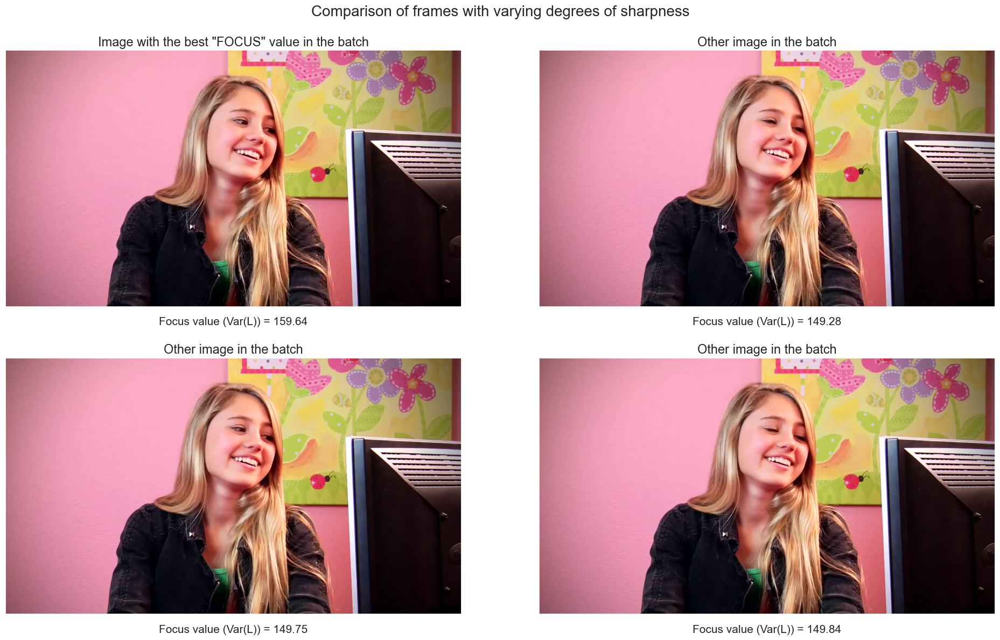

In [29]:
fig, ax = plt.subplots(2, 2, figsize=(20, 12))

ax[0][0].imshow(cv2.cvtColor(_frames[-1], cv2.COLOR_BGR2RGB))
ax[0][0].grid(False)  # Disable the grid for each subplot
ax[0][0].set_title(f'Image with the best "FOCUS" value in the batch', fontsize=17)
ax[0][0].set_xlabel(f'Focus value (Var(L)) = {round(_frames_focus[-1], 2)}', fontsize=15)
ax[0][0].set_yticklabels([])
ax[0][0].set_xticklabels([])

ax[0][1].imshow(cv2.cvtColor(_frames[0], cv2.COLOR_BGR2RGB))
ax[0][1].grid(False)  # Disable the grid for each subplot
ax[0][1].set_title(f'Other image in the batch', fontsize=17)
ax[0][1].set_xlabel(f'Focus value (Var(L)) = {round(_frames_focus[0], 2)}', fontsize=15)
ax[0][1].set_yticklabels([])
ax[0][1].set_xticklabels([])

ax[1][0].imshow(cv2.cvtColor(_frames[1], cv2.COLOR_BGR2RGB))
ax[1][0].grid(False)  # Disable the grid for each subplot
ax[1][0].set_title(f'Other image in the batch', fontsize=17)
ax[1][0].set_xlabel(f'Focus value (Var(L)) = {round(_frames_focus[1], 2)}', fontsize=15)
ax[1][0].set_yticklabels([])
ax[1][0].set_xticklabels([])

ax[1][1].imshow(cv2.cvtColor(_frames[2], cv2.COLOR_BGR2RGB))
ax[1][1].grid(False)  # Disable the grid for each subplot
ax[1][1].set_title(f'Other image in the batch', fontsize=17)
ax[1][1].set_xlabel(f'Focus value (Var(L)) = {round(_frames_focus[2], 2)}', fontsize=15)
ax[1][1].set_yticklabels([])
ax[1][1].set_xticklabels([])

# Set the title for the entire plot
fig.suptitle('Comparison of frames with varying degrees of sharpness', fontsize=20)

# Adjust spacing between subplots
plt.tight_layout()

# Adjust vertical spacing between rows (add padding between rows)
plt.subplots_adjust(hspace=0.2, top=0.91)

plt.show()

In [ ]:
_best_focus_arg = np.argmax(_frames_focus)

_best_frame = _frames[_best_focus_arg]
_frames.pop(_best_focus_arg)

plt.imshow(cv2.cvtColor(_best_frame, cv2.COLOR_BGR2RGB))
plt.grid(False)
plt.show()

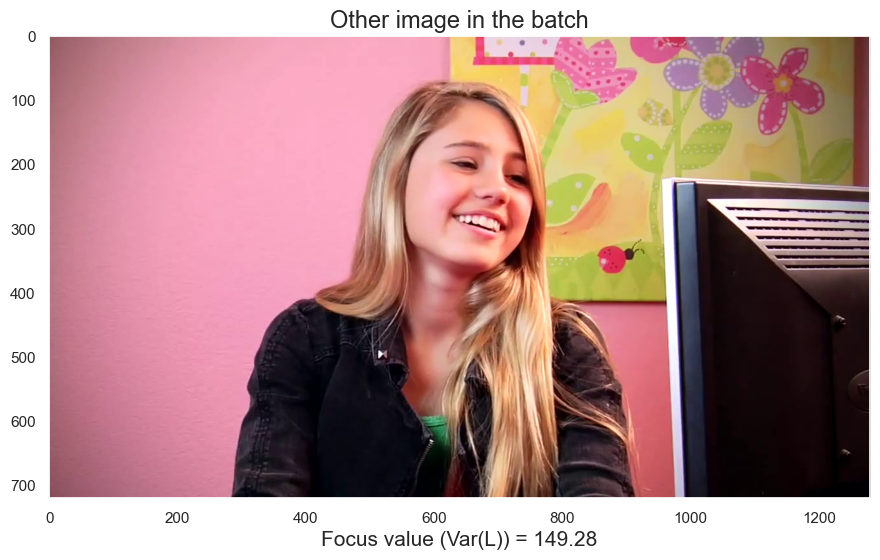

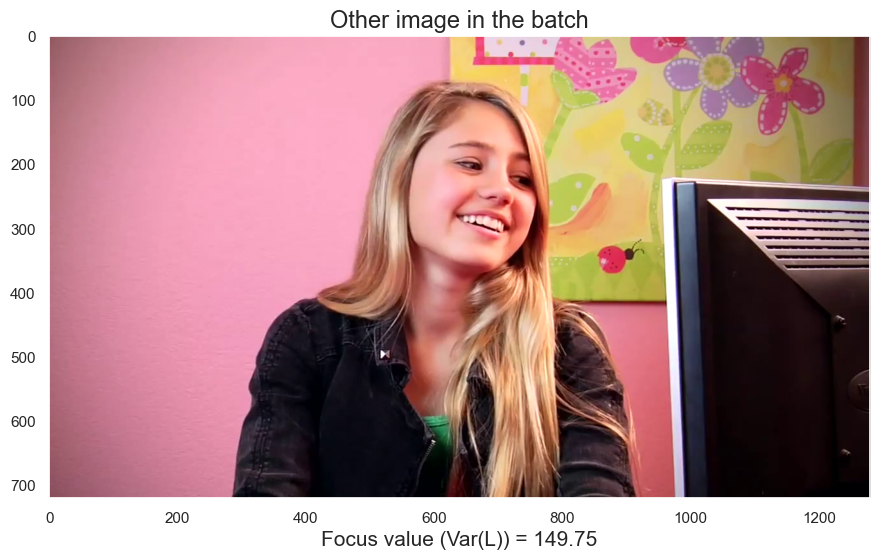

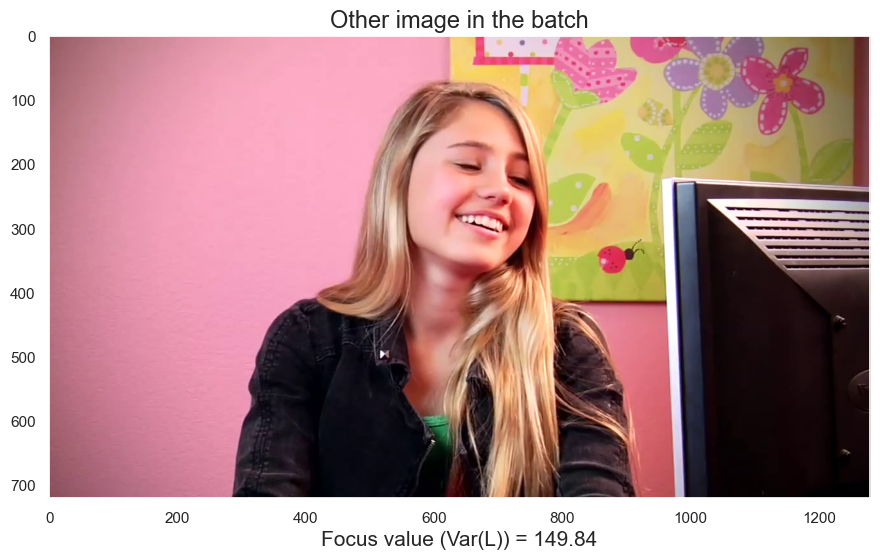

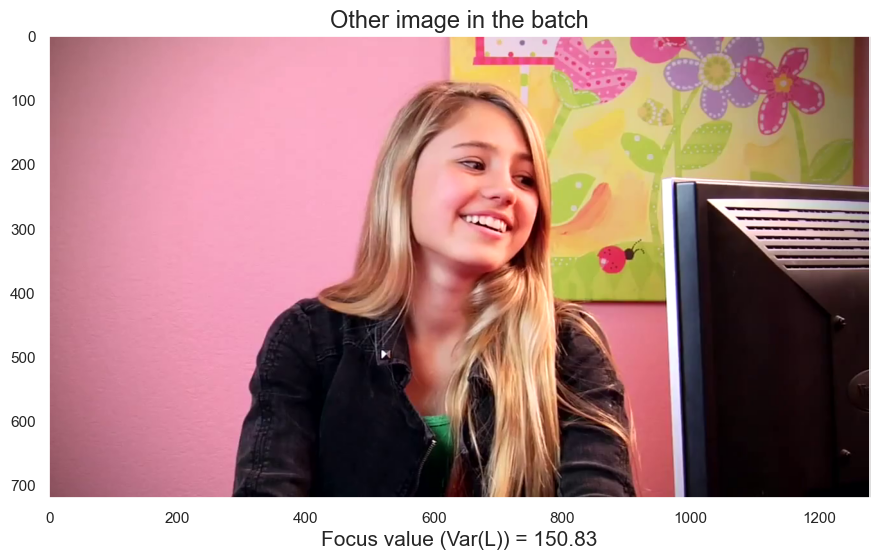

In [31]:
for _idx, _frame in enumerate(_frames[:4]):
    plt.imshow(cv2.cvtColor(_frame, cv2.COLOR_BGR2RGB))
    plt.title(f'Other image in the batch', fontsize=17)
    plt.xlabel(f'Focus value (Var(L)) = {round(_frames_focus[_idx], 2)}', fontsize=15)
    plt.grid(False)
    plt.show()

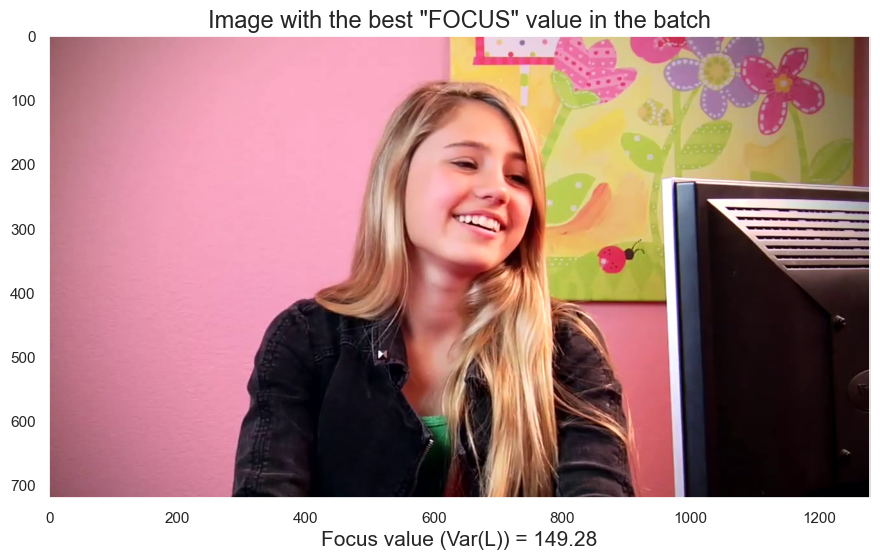

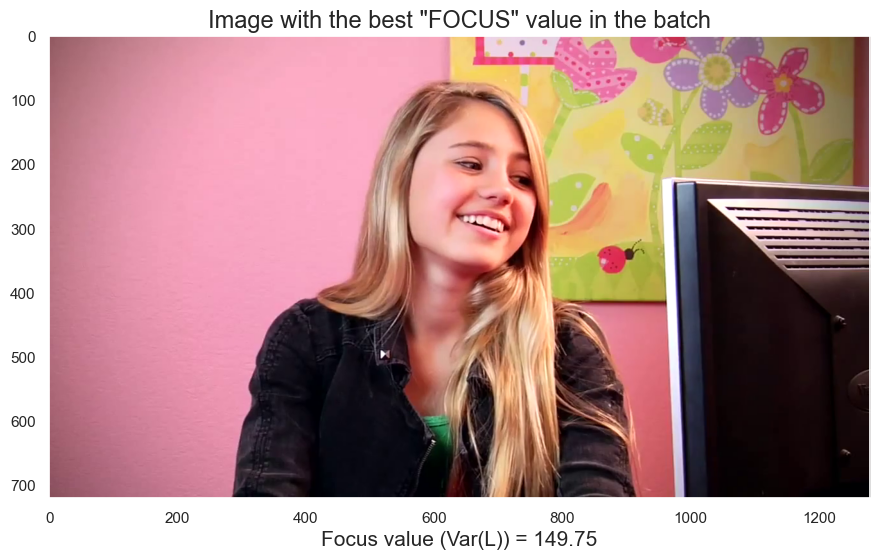

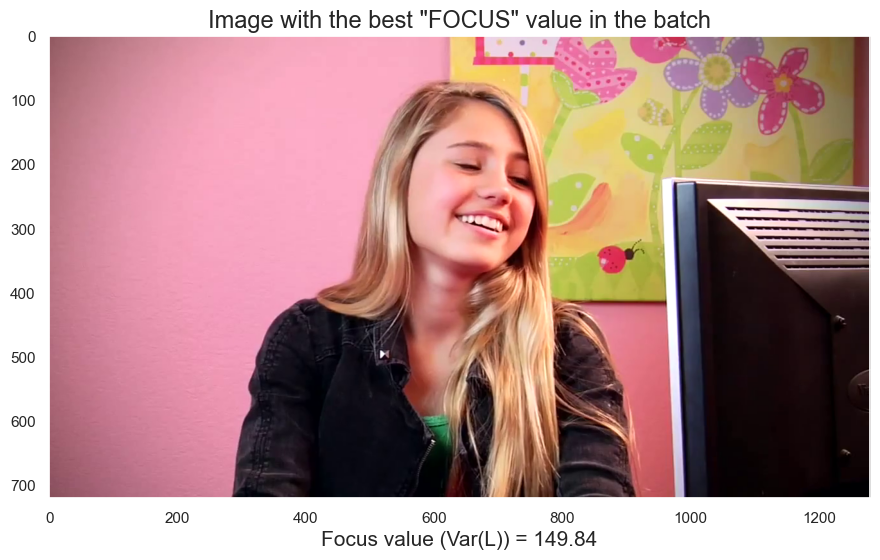

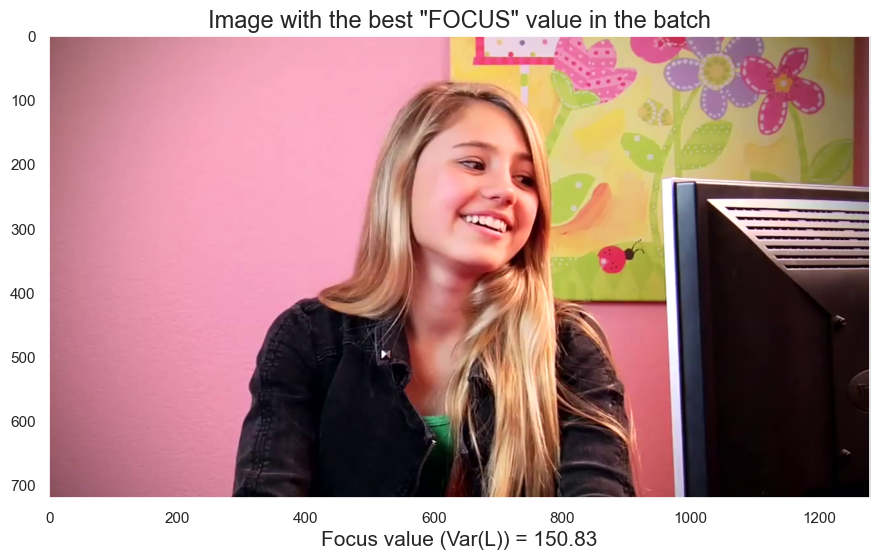

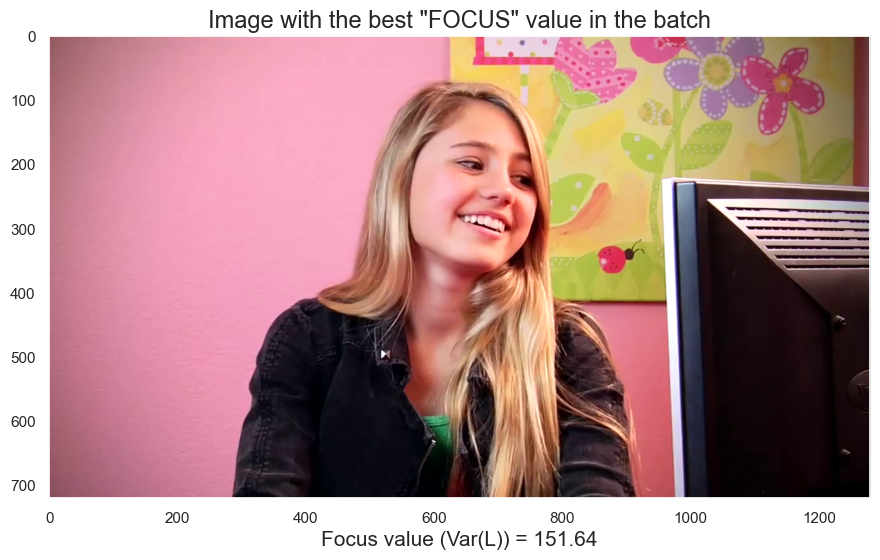

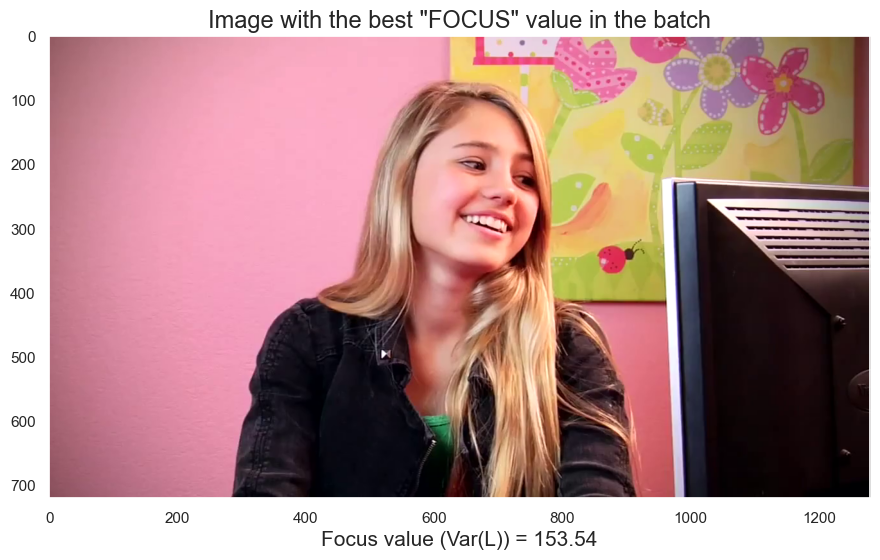

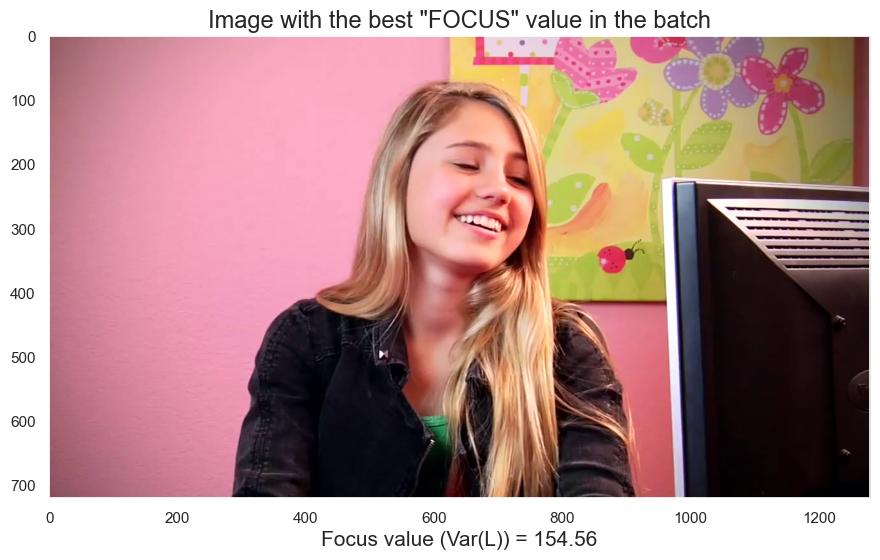

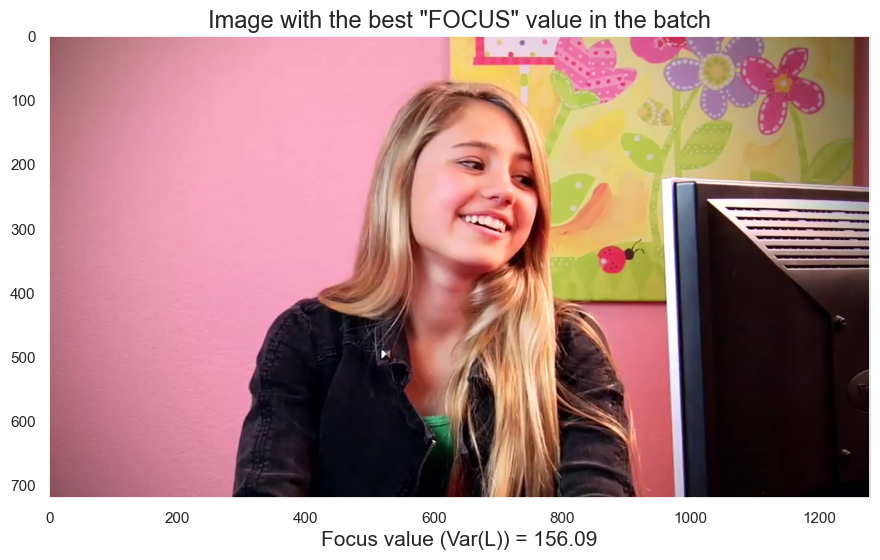

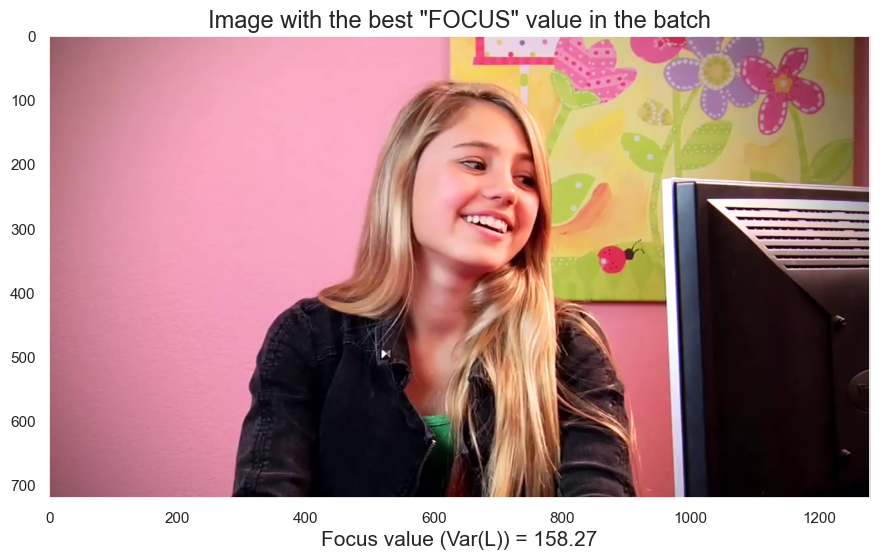

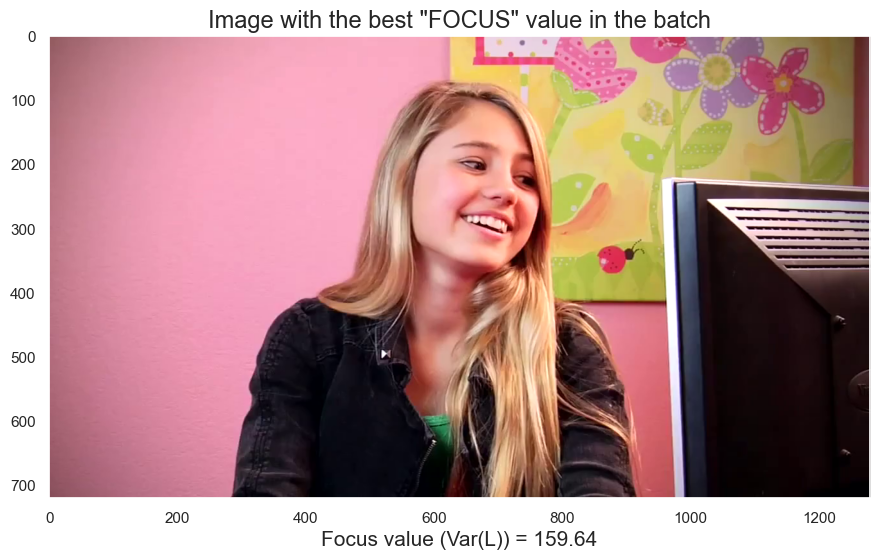

In [35]:
for _idx, _frame in enumerate(_frames):
    plt.imshow(cv2.cvtColor(_frame, cv2.COLOR_BGR2RGB))
    plt.title(f'Image with the best "FOCUS" value in the batch', fontsize=17)
    plt.xlabel(f'Focus value (Var(L)) = {round(_frames_focus[_idx], 2)}', fontsize=15)
    plt.grid(False)
    plt.show()